# Introduction
Spatial functions

### Methods Included
- LISA
- Global and Local Moran's I
- Standard Distance
- Quadrat count

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import mplleaflet
import datetime
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import libpysal
import pysal as ps # v2.0.0
import splot # spatial plotting for pysal 2.0.0
# from pysal.viz import splot
import shapely
import shapely.wkt
import scipy.stats as stats
import sys
import gpd_lite_toolbox as glt
import geoplot
import collections

from splot.esda import plot_local_autocorrelation, lisa_cluster

from gpd_lite_toolbox.utils_carto import m_plot_dataframe, m_plot_multipolygon
sys.path.append('../utils')
import direction_functions
import spatial_functions
import temporal_functions

%matplotlib inline

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/windrose/windrose.py:29: MatplotlibDeprecationWarning: 
The Appender class was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  addendum = docstring.Appender(msg, "\n\n")
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/windrose/windrose.py:30: MatplotlibDeprecationWarning: 
The copy_dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use docstring.copy() and cbook.dedent() instead.
  return lambda func: addendum(docstring.copy_dedent(base)(func))
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/windrose/windrose.py:30: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.getdoc() 

In [2]:
gdf = gpd.read_file("../app_route_data/trajets_mtl_trajet_2017.shp", encoding='utf-8') # utf-8 needed to read french letters
# gdf_per_dissem = gpd.read_file("../app_route_data/mtl_dissem_mtl_trajet_join.shp", encoding='utf-8')
mtl_region = gpd.read_file("../shapes/mtl_all_regions.json")
mtl_dissem = gpd.read_file("../shapes/mtl_dissem.geojson")

In [3]:
# outlier removal
gdf = gdf.loc[gdf.distance_m >= 50]
gdf = gdf.loc[gdf.seconds >= 60]
gdf = gdf.loc[gdf.distance_m <= 100000]
gdf = gdf.loc[gdf.seconds <= 10800]

In [4]:
# turn the data back into datetime
gdf['starttime'] = gdf['starttime'].apply(gpd.pd.to_datetime)
gdf['endtime'] = gdf['endtime'].apply(gpd.pd.to_datetime)

In [5]:
# convert the point columns back into a Point class
gdf['start_wgs'] = gdf['start_wgs'].apply(shapely.wkt.loads)
gdf['start_can'] = gdf['start_can'].apply(shapely.wkt.loads)
gdf['end_wgs'] = gdf['end_wgs'].apply(shapely.wkt.loads)
gdf['end_can'] = gdf['end_can'].apply(shapely.wkt.loads)

In [6]:
rush = gdf.loc[(gdf.startrush == 1)|(gdf.endrush == 1)|(gdf.thrurush == 1)]
non_rush = gdf.loc[(gdf.startrush != 1)&(gdf.endrush != 1)&(gdf.thrurush != 1)]

city = gdf.loc[(gdf.start_down == 1)|(gdf.end_downto == 1)]
non_city = gdf.loc[(gdf.start_down != 1)&(gdf.end_downto != 1)]

start_city = gdf.loc[(gdf.start_down == 1)]
start_non_city = gdf.loc[(gdf.start_down != 1)]
end_city = gdf.loc[(gdf.end_downto == 1)]
end_non_city = gdf.loc[(gdf.end_downto != 1)]

## Globals

In [8]:
## get all the purposes and modes above 1000 trips
above1000_purpose = gdf.groupby(['purpose']).count()['id_trip'][gdf.groupby(['purpose']).count()['id_trip'] > 1000].index
above1000_mode = gdf.groupby(['mode']).count()['id_trip'][gdf.groupby(['mode']).count()['id_trip'] > 1000].index
ordered_days = ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']

## mapping

### slow way

In [3]:
%%time
# time for 1000 == 7 mins
# total vals == 185285
chosen_mode = 'car'
total_dissem_arr = [] # dissemination area
total_reg_arr = [] # regions
total_code_arr = [] # montreal island codes
for i in range(501):
    cross_section_joined = gpd.sjoin(gdf.loc[gdf['mode'] == chosen_mode].iloc[i:i+1], mtl_dissem)
    dissem_arr, reg_arr = spatial_functions.get_intersecting_dissemination_ids(cross_section_joined, mtl_dissem)
    if i % 100 == 0:
        print(i)
    total_dissem_arr.extend(dissem_arr)
    total_reg_arr.extend(reg_arr)

0
100
200
300


KeyboardInterrupt: 

In [4]:
collections.Counter(total_dissem_arr)

Counter({'24662610': 15,
         '24662627': 21,
         '24662606': 10,
         '24660492': 5,
         '24662619': 22,
         '24660256': 21,
         '24662087': 8,
         '24662001': 9,
         '24660416': 21,
         '24662004': 6,
         '24662605': 19,
         '24660242': 11,
         '24660458': 26,
         '24662089': 5,
         '24660243': 11,
         '24660415': 20,
         '24660362': 19,
         '24662043': 6,
         '24661768': 6,
         '24660491': 28,
         '24662109': 5,
         '24662003': 5,
         '24661672': 5,
         '24662042': 6,
         '24662607': 22,
         '24660364': 18,
         '24662045': 4,
         '24662077': 5,
         '24660360': 19,
         '24660257': 7,
         '24662626': 11,
         '24662608': 11,
         '24662069': 5,
         '24660363': 4,
         '24660359': 20,
         '24661765': 5,
         '24662611': 20,
         '24650440': 6,
         '24650640': 6,
         '24730120': 4,
         '24730137':

In [5]:
mtl_dissem['freq_dissem_counts'] = mtl_dissem.apply(lambda row: collections.Counter(total_dissem_arr)[row.DAUID], axis=1)
mtl_region['freq_reg_counts'] = mtl_region.apply(lambda row: collections.Counter(total_reg_arr)[row.CSDUID], axis=1)

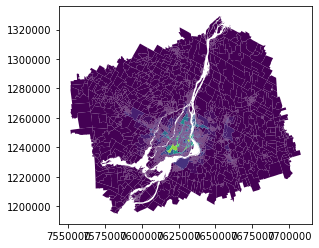

In [6]:
mtl_dissem.plot('freq_dissem_counts')

### fast way

In [4]:
help(spatial_functions.plot_counts)

Help on function plot_counts in module spatial_functions:

plot_counts(data, mtl_dissemination_areas, var, purpose=True, cmap='Reds', return_df=False, plot=True)
    function for plotting a map of counts of a variable



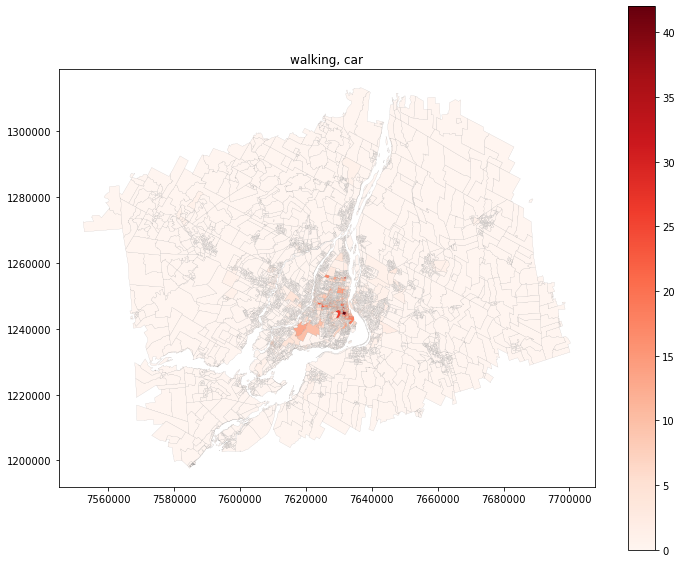

In [7]:
spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem, var='walking, car', purpose=False, plot=True)

In [10]:
joined_data = spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem,\
                                            var='walking, car', purpose=False, cmap='Blues', return_df=True, plot=False)

In [11]:
joined_data.head()

,DAUID,CDUID,CDNAME,CDTYPE,CSDUID,CSDNAME,CSDTYPE,CCSUID,CCSNAME,ERUID,...,CMANAME,CMATYPE,SACCODE,SACTYPE,CTUID,CTNAME,PRUID,PRNAME,geometry,freq_dissem_counts
0,24700071,2470,Beauharnois-Salaberry,MRC,2470022,Beauharnois,V,2470022,Beauharnois,2435,...,Montral,B,462,1,4620777.02,0777.02,24,Quebec / Qubec,(POLYGON ((7614920.211429008 1216981.757154953...,0
1,24650694,2465,Laval,T,2465005,Laval,V,2465005,Laval,2445,...,Montral,B,462,1,4620659.10,0659.10,24,Quebec / Qubec,(POLYGON ((7612254.411394808 1252883.785716854...,0
2,24662467,2466,Montral,T,2466023,Montral,V,2466023,Montral,2440,...,Montral,B,462,1,4620416.01,0416.01,24,Quebec / Qubec,(POLYGON ((7618928.159977993 1242899.359981268...,0
3,24662706,2466,Montral,T,2466023,Montral,V,2466023,Montral,2440,...,Montral,B,462,1,4620619.00,0619.00,24,Quebec / Qubec,"(POLYGON ((7622684.02860707 1251714.83427309, ...",4
4,24580036,2458,Longueuil,T,2458227,Longueuil,V,2458227,Longueuil,2435,...,Montral,B,462,1,4620880.00,0880.00,24,Quebec / Qubec,(POLYGON ((7635632.045734551 1249192.339954694...,0


##### LISA

In [21]:
wq = ps.lib.weights.contiguity.Queen.from_dataframe(mtl_dissem)
y = joined_data['freq_dissem_counts'].values
moran_loc = ps.explore.esda.Moran_Local(y, wq)

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/lib/weights/weights.py:168: UserWarning: There are 4 disconnected observations 
  Island ids: 3641, 4879, 6388, 6599
  " Island ids: %s" % ', '.join(str(island) for island in self.islands))


NameError: name 'joined_data' is not defined

Text(0.5, 1, 'LISA map of walking, car')

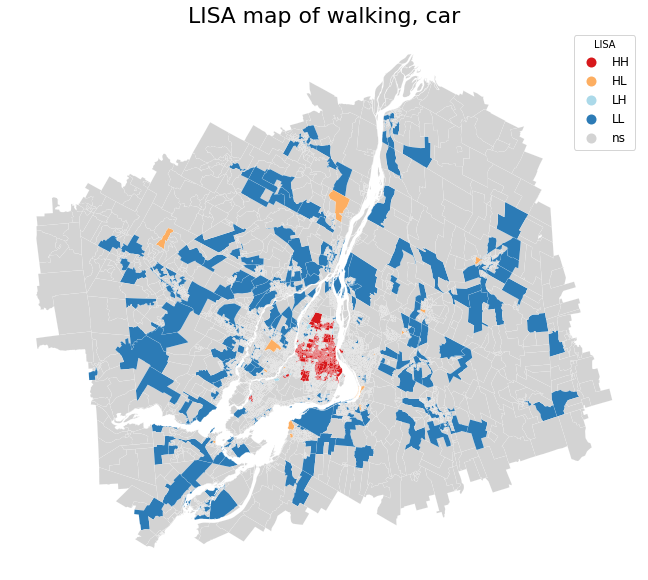

In [28]:
fig, ax = plt.subplots(1, figsize=(12,10))
lisa_cluster(moran_loc, mtl_dissem, ax=ax, legend_kwds={'title':'LISA', 'fontsize':12})
ax.set_title("LISA map of walking, car", size=22)


### for all:


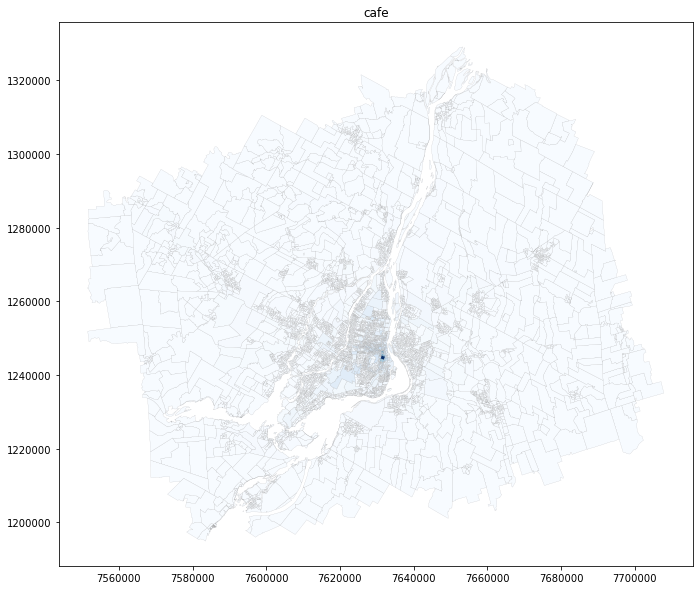

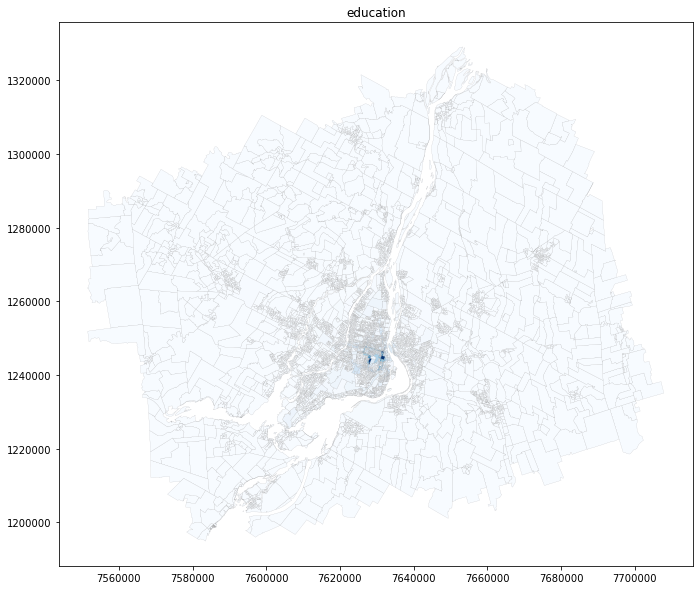

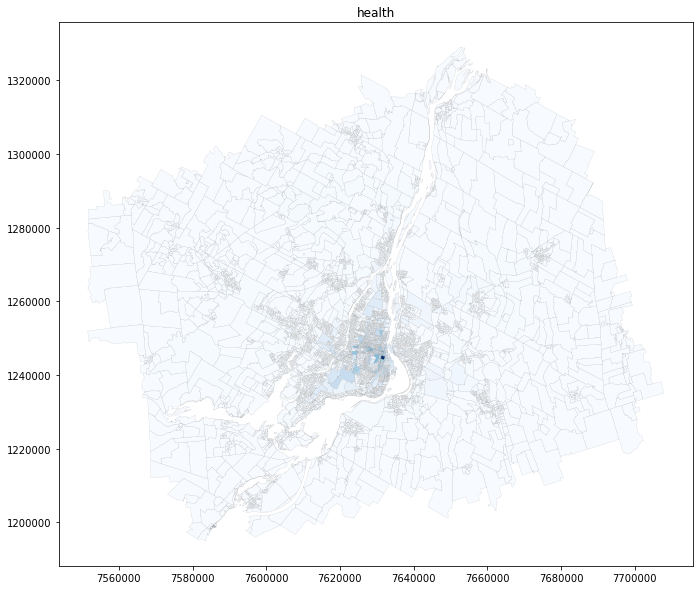

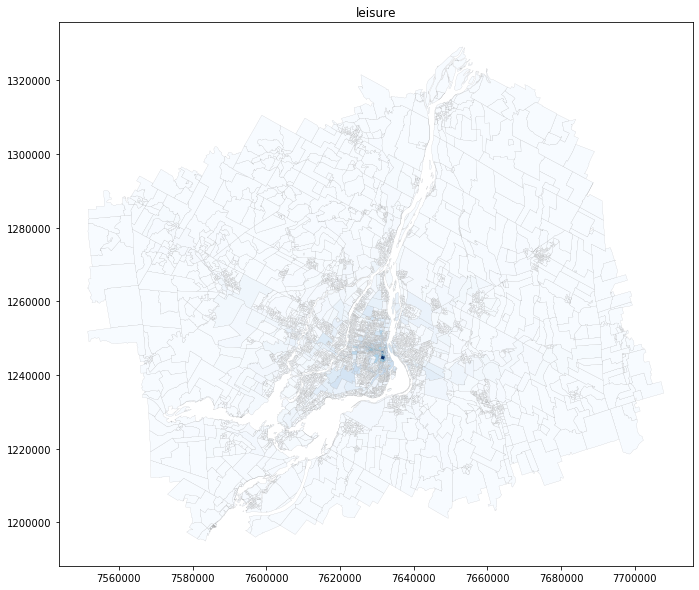

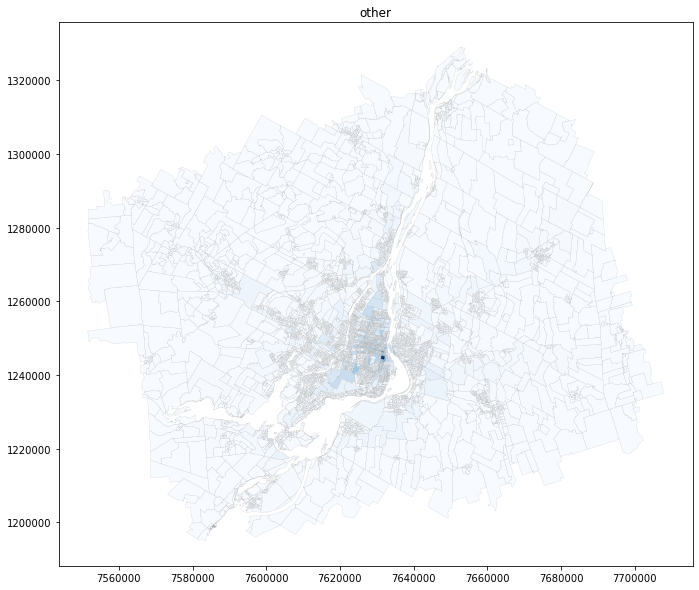

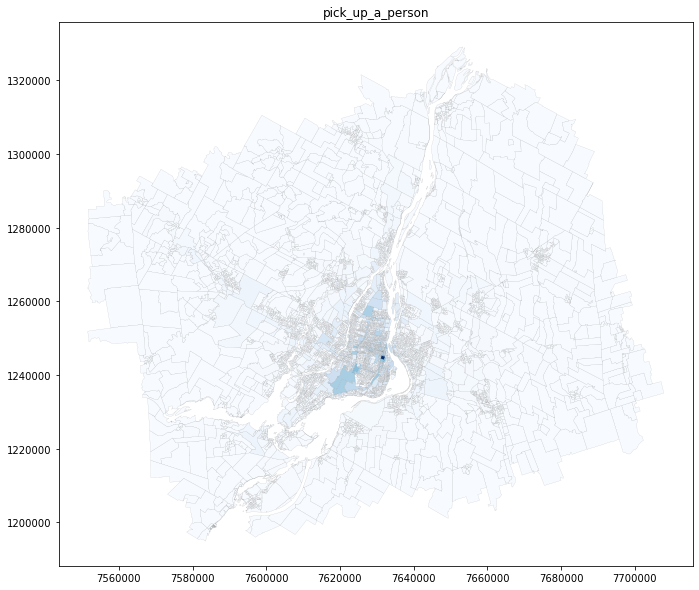

In [ ]:
for var in above1000_purpose:
    spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem,\
                                            var=var, purpose=True, cmap='Blues', return_df=False, plot=True)
    ax.set_title("%s" % (var), size=22)
    plt.savefig("figures/{0}_count_map.png".format(var), bbox_inches='tight')
    plt.show()
    plt.close()

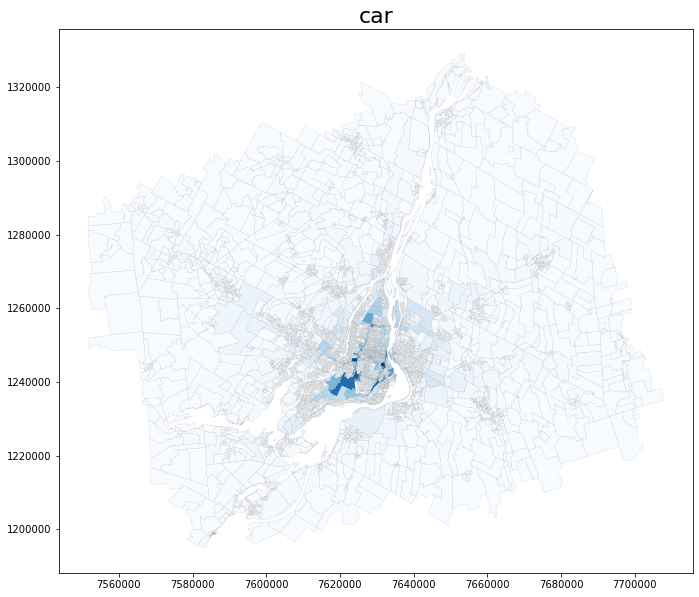

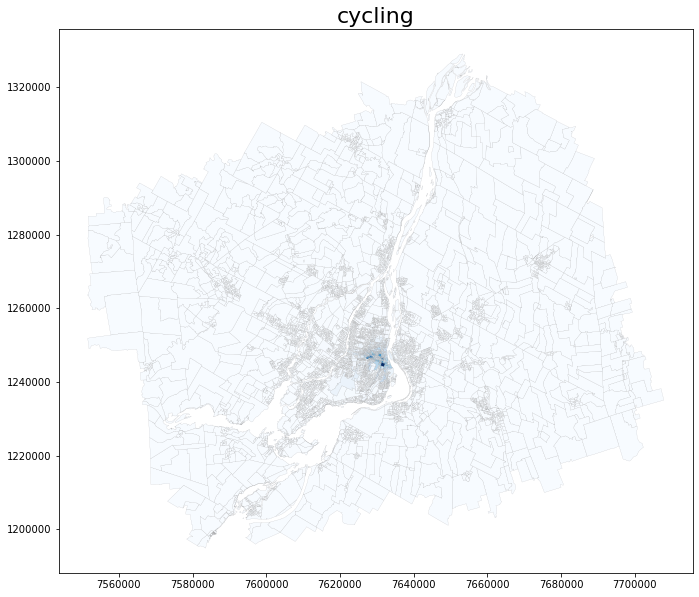

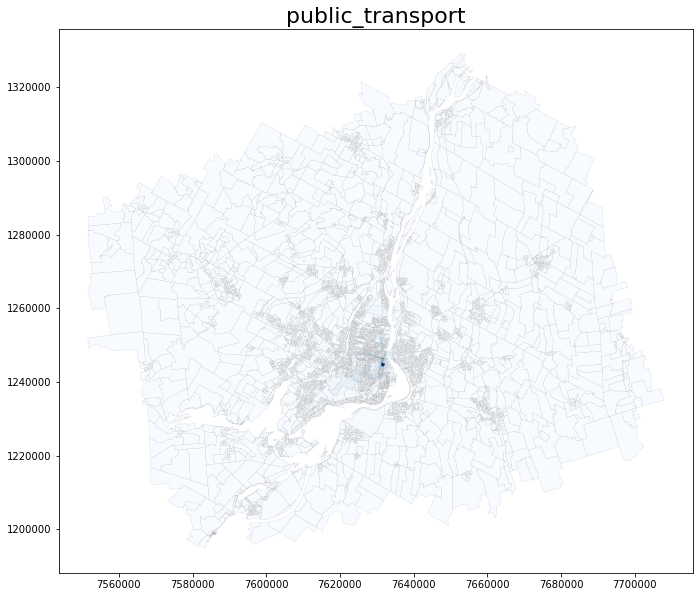

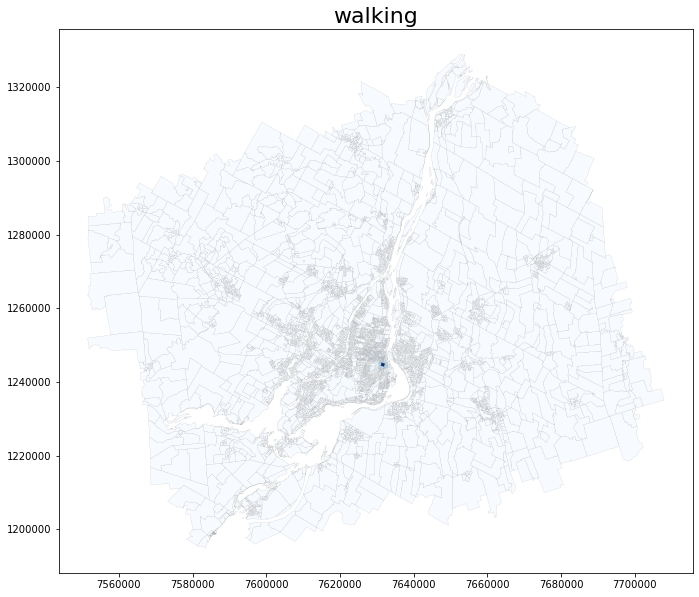

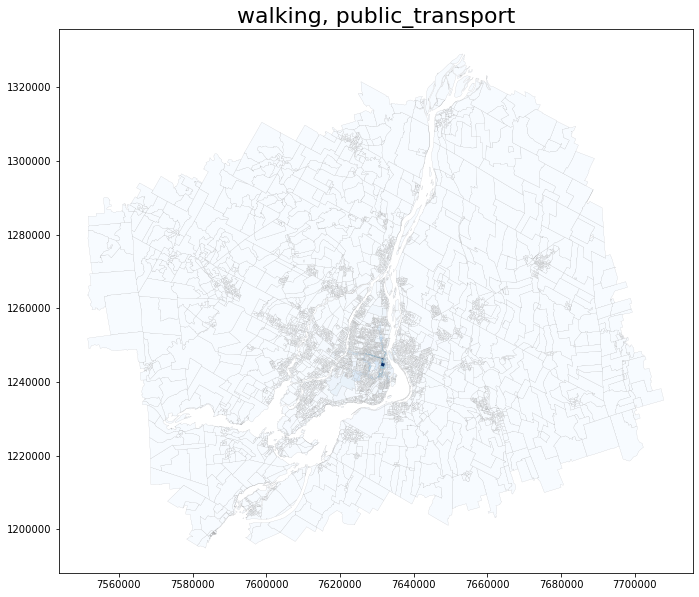

In [43]:
### for all:
for var in above1000_mode:
    spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem,\
                                            var=var, purpose=False, cmap='Blues', return_df=False, plot=True)
    ax = plt.gca()
    ax.set_title("%s" % (var), size=22)
    plt.savefig("figures/{0}_count_map.png".format(var), bbox_inches='tight')
    plt.show()
    plt.close()

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


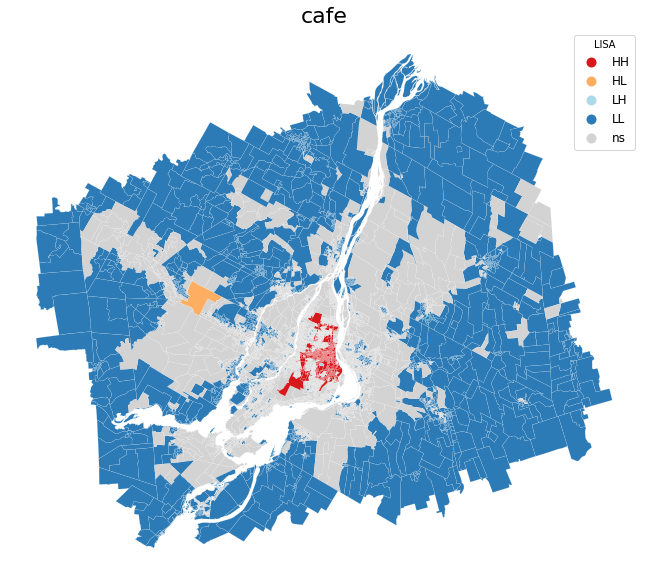

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


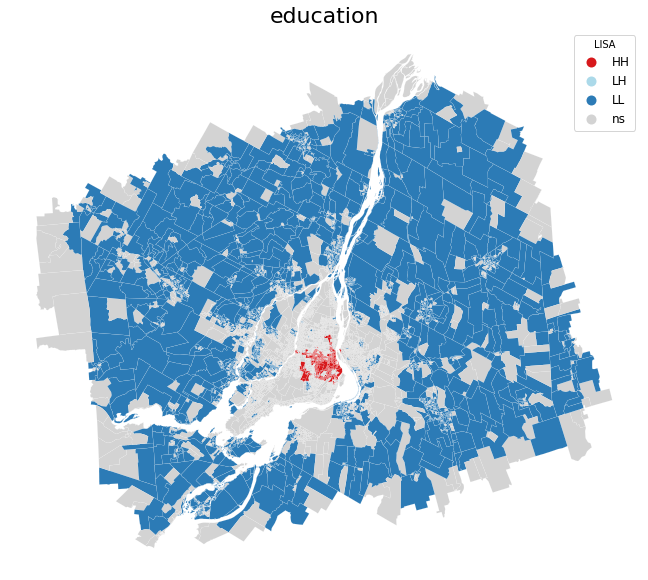

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


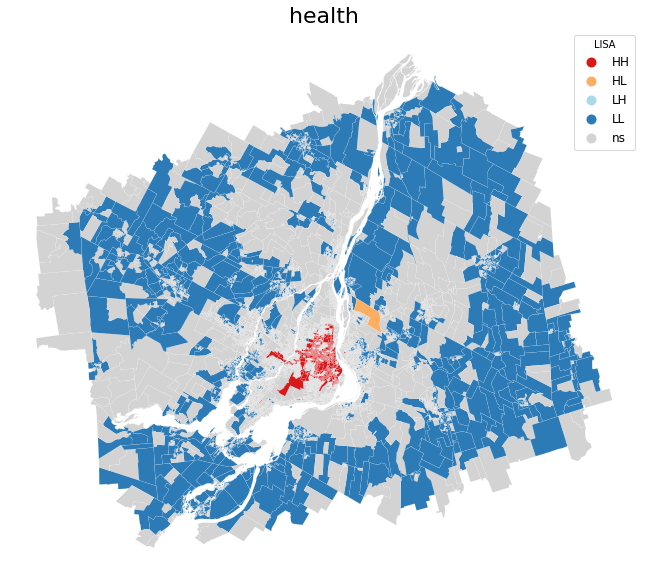

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


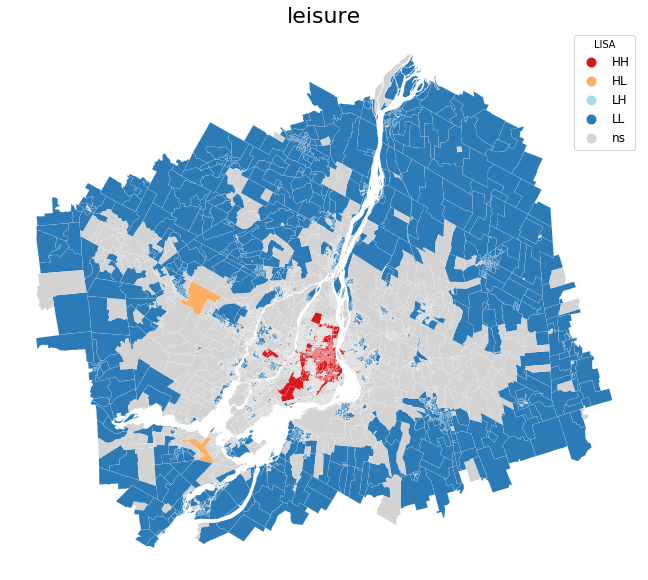

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


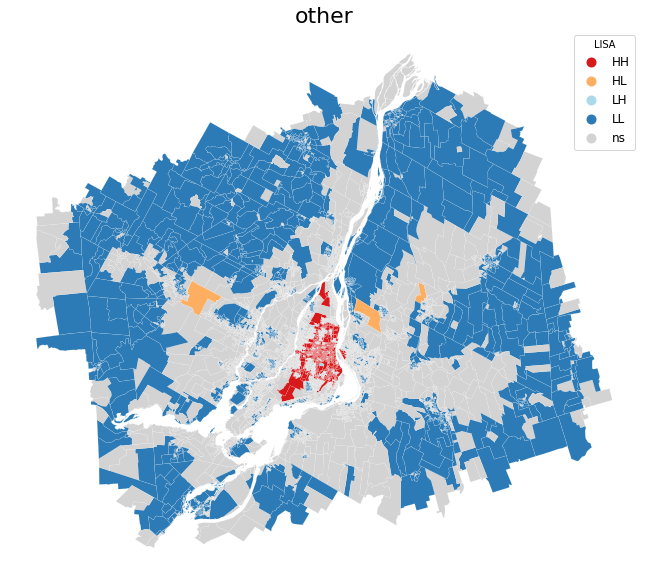

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


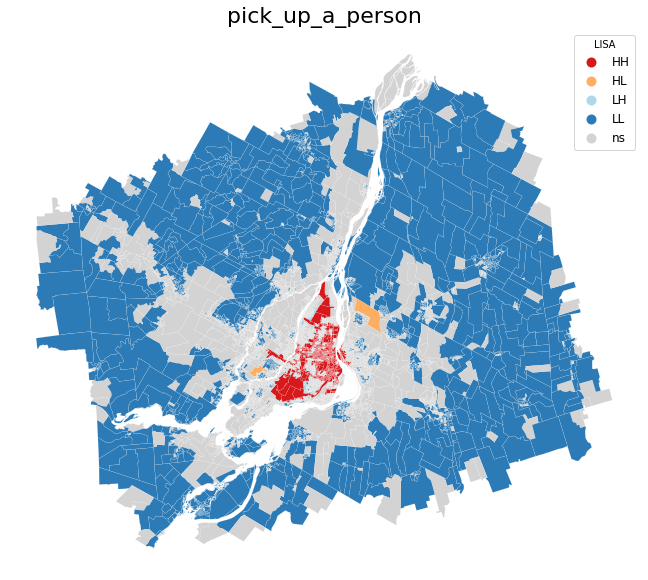

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


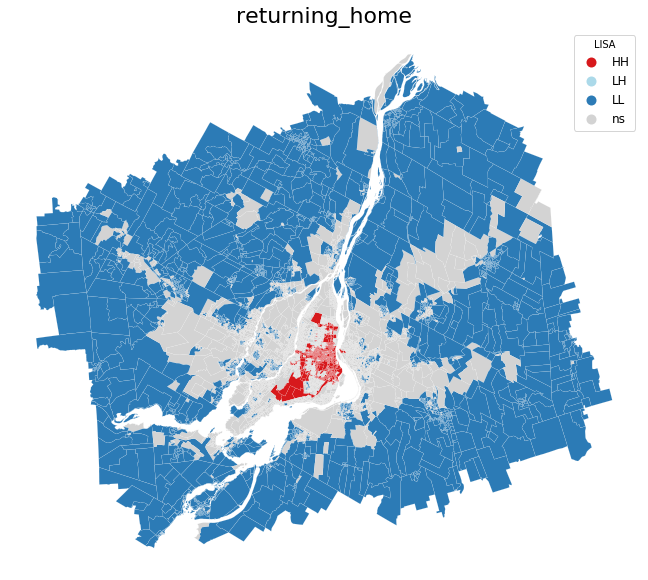

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


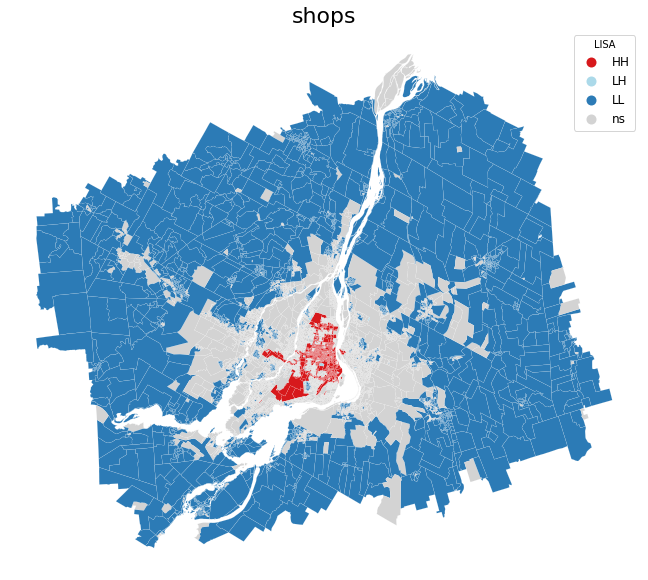

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


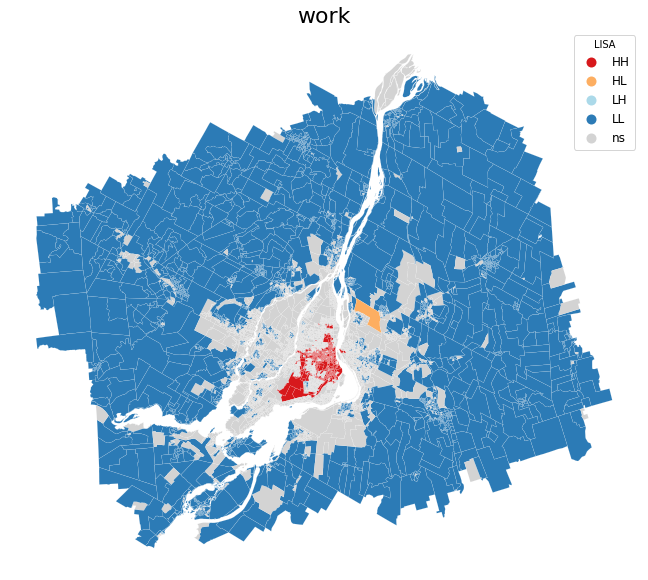

In [32]:
for var in above1000_purpose:
    joined_data = spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem,\
                                            var=var, purpose=True, cmap='Blues', return_df=True, plot=False)
    wq = ps.lib.weights.contiguity.Queen.from_dataframe(mtl_dissem)
    y = joined_data['freq_dissem_counts'].values
    moran_loc = ps.explore.esda.Moran_Local(y, wq)
    fig, ax = plt.subplots(1, figsize=(12,10))
    lisa_cluster(moran_loc, mtl_dissem, ax=ax, legend_kwds={'title':'LISA', 'fontsize':12})
    ax.set_title("%s" % (var), size=22)
#     plt.savefig("figures/{0}_LISA_map.png".format(var), bbox_inches='tight')
    plt.show()
    plt.close()

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


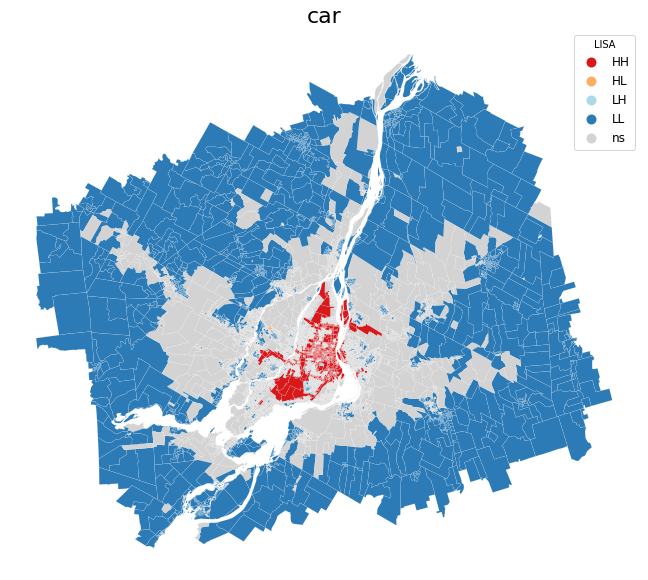

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


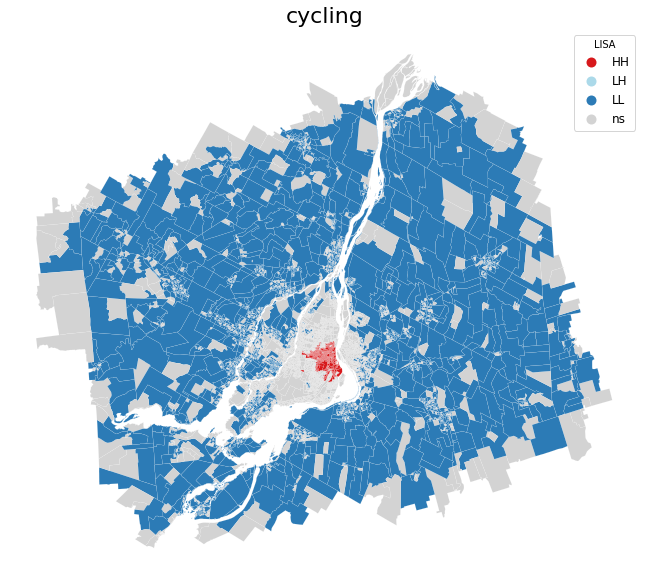

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


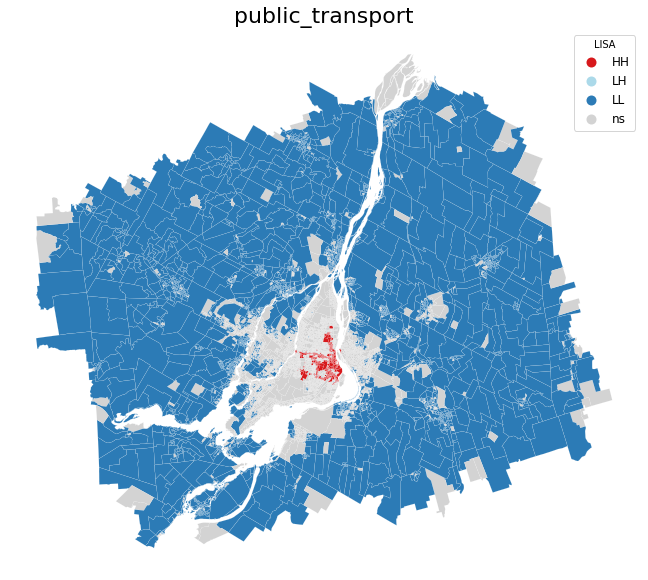

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


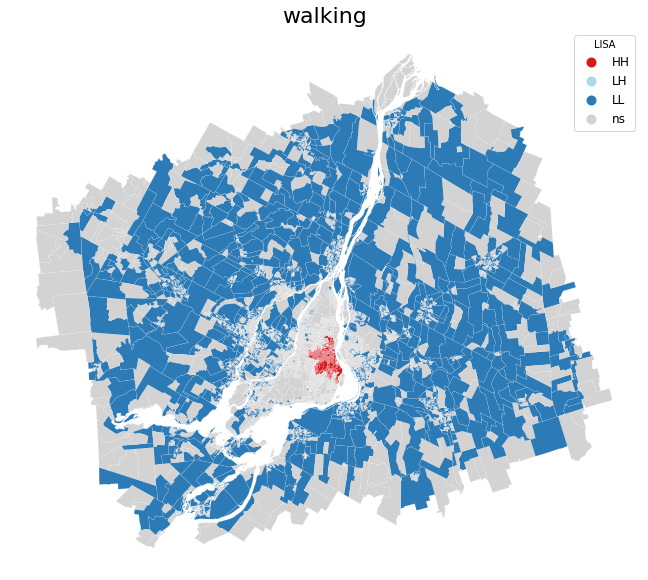

('WARNING: ', 3776, ' is an island (no neighbors)')
('WARNING: ', 6845, ' is an island (no neighbors)')


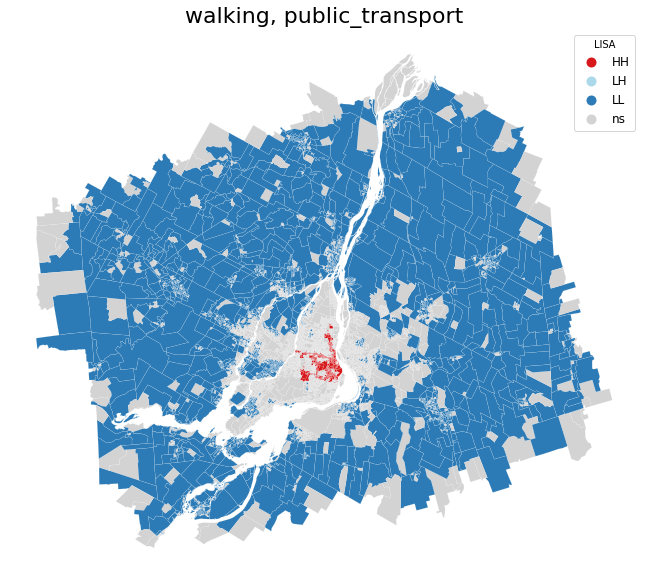

In [33]:
### for all:
for var in above1000_mode:
    joined_data = spatial_functions.plot_counts(data=gdf, mtl_dissemination_areas=mtl_dissem,\
                                            var=var, purpose=False, cmap='Blues', return_df=True, plot=False)
    wq = ps.lib.weights.contiguity.Queen.from_dataframe(mtl_dissem)
    y = joined_data['freq_dissem_counts'].values
    moran_loc = ps.explore.esda.Moran_Local(y, wq)
    fig, ax = plt.subplots(1, figsize=(12,10))
    lisa_cluster(moran_loc, mtl_dissem, ax=ax, legend_kwds={'title':'LISA', 'fontsize':12})
    ax.set_title("%s" % (var), size=22)
#     plt.savefig("figures/{0}_LISA_map.png".format(var), bbox_inches='tight')
    plt.show()
    plt.close()

## geographically weighted regression

In [28]:
%%time
# gdf_per_dissem = gpd.sjoin(mtl_dissem, gdf, how='right')

CPU times: user 23min 56s, sys: 46.2 s, total: 24min 43s
Wall time: 26min 36s


In [34]:
gdf_per_dissem.head()

,index_left,DAUID,CDUID,CDNAME,CDTYPE,CSDUID,CSDNAME,CSDTYPE,CCSUID,CCSNAME,...,thrurush,lda_word,temporal_c,precip,temperatur,start_wgs,end_wgs,start_can,end_can,geometry
index_right,,,,,,,,,,,,,,,,,,,,,
133396,0.0,24700071,2470,Beauharnois-Salaberry,MRC,2470022,Beauharnois,V,2470022,Beauharnois,...,0,None,0,0.001028,14.498385,POINT (-73.86181300000003 45.30721499999978),POINT (-73.46545900000004 45.45512199999979),POINT (7615472.302417528 1216970.602179925),POINT (7641005.008367594 1241886.422244814),(LINESTRING (7614131.800874355 1217367.1414871...
133396,230.0,24580360,2458,Longueuil,T,2458007,Brossard,V,2458007,Brossard,...,0,None,0,0.001028,14.498385,POINT (-73.86181300000003 45.30721499999978),POINT (-73.46545900000004 45.45512199999979),POINT (7615472.302417528 1216970.602179925),POINT (7641005.008367594 1241886.422244814),(LINESTRING (7614131.800874355 1217367.1414871...
133396,600.0,24700078,2470,Beauharnois-Salaberry,MRC,2470022,Beauharnois,V,2470022,Beauharnois,...,0,None,0,0.001028,14.498385,POINT (-73.86181300000003 45.30721499999978),POINT (-73.46545900000004 45.45512199999979),POINT (7615472.302417528 1216970.602179925),POINT (7641005.008367594 1241886.422244814),(LINESTRING (7614131.800874355 1217367.1414871...
133396,885.0,24700076,2470,Beauharnois-Salaberry,MRC,2470022,Beauharnois,V,2470022,Beauharnois,...,0,None,0,0.001028,14.498385,POINT (-73.86181300000003 45.30721499999978),POINT (-73.46545900000004 45.45512199999979),POINT (7615472.302417528 1216970.602179925),POINT (7641005.008367594 1241886.422244814),(LINESTRING (7614131.800874355 1217367.1414871...
133396,1218.0,24670311,2467,Roussillon,MRC,2467020,Candiac,V,2467035,Saint-Constant,...,0,None,0,0.001028,14.498385,POINT (-73.86181300000003 45.30721499999978),POINT (-73.46545900000004 45.45512199999979),POINT (7615472.302417528 1216970.602179925),POINT (7641005.008367594 1241886.422244814),(LINESTRING (7614131.800874355 1217367.1414871...


In [39]:
gdf_per_dissem['starttime'] = gdf_per_dissem['starttime'].astype(str)
gdf_per_dissem['endtime'] = gdf_per_dissem['endtime'].astype(str)
gdf_per_dissem['start_wgs'] = gdf_per_dissem['start_wgs'].astype(str)
gdf_per_dissem['start_can'] = gdf_per_dissem['start_can'].astype(str)
gdf_per_dissem['end_wgs'] = gdf_per_dissem['end_wgs'].astype(str)
gdf_per_dissem['end_can'] = gdf_per_dissem['end_can'].astype(str)

In [40]:
# gdf_per_dissem.to_file("../app_route_data/mtl_dissem_mtl_trajet_join.shp", encoding='utf-8')

RuntimeError: Failed to write record: {'id': '80231', 'type': 'Feature', 'properties': {'CCSNAME': 'Montral', 'CCSUID': '2466023', 'CDNAME': 'Montral', 'CDTYPE': 'T', 'CDUID': '2466', 'CMANAME': 'Montral', 'CMAPUID': '24462', 'CMATYPE': 'B', 'CMAUID': '462', 'CSDNAME': 'Montral', 'CSDTYPE': 'V', 'CSDUID': '2466023', 'CTNAME': '0156.00', 'CTUID': '4620156.00', 'DAUID': '24661818', 'ERNAME': 'Montral', 'ERUID': '2440', 'PRNAME': 'Quebec / Qubec', 'PRUID': '24', 'SACCODE': '462', 'SACTYPE': '1', 'carddir': 'NNE', 'direction': 15.0179250029908, 'distance_m': 4495.0895464188425, 'end_can': 'POINT (7630272.646038665 1249403.792903235)', 'end_downto': 1, 'end_wgs': 'POINT (-73.56819200000002 45.5460699999998)', 'endhour': 17, 'endrush': 1, 'endtime': '2017-10-03 18:18:03-04:00', 'id_trip': 353316, 'index_left': 3075.0, 'lda_word': 'Tuesday_17, returning_home', 'magnitude': 0.208624224322924, 'mode': 'walking, public_transport', 'precip': 0.0, 'purpose': 'returning_home', 'seconds': 2070, 'start_can': 'POINT (7631235.6724896 1245173.477101161)', 'start_down': 1, 'start_wgs': 'POINT (-73.57168200000004 45.5076859999998)', 'starthour': 17, 'startrush': 1, 'starttime': '2017-10-03 17:43:33-04:00', 'temperatur': 21.0808130757178, 'temporal_c': 5, 'thrurush': 1, 'weekday': '1'}, 'geometry': {'type': 'MultiLineString', 'coordinates': (((7631235.038959809, 1245168.3486966141), (7631233.118405279, 1245153.310504004), (7631235.6724896, 1245173.477101161)), ((7631239.218024991, 1245207.3482455467), (7631241.865130108, 1245233.0715527488), (7631244.307639582, 1245256.9696931662), (7631244.42403093, 1245258.5334771925)), ((7631245.606734951, 1245288.6468808064), (7631246.680428616, 1245314.3752570276), (7631247.750308725, 1245341.5142010737), (7631248.743224317, 1245364.1599626443), (7631248.984687456, 1245371.1722846285), (7631248.827942157, 1245389.5957215237), (7631248.657371316, 1245420.3674718204)), ((7631248.190538818, 1245474.2270031816), (7631248.390182503, 1245494.5204639165), (7631248.4432906285, 1245500.7711916643), (7631248.740375321, 1245505.9176826936), (7631249.292371722, 1245527.2565107734), (7631249.925257087, 1245553.9131379381), (7631250.198953394, 1245563.0525213717), (7631250.464731211, 1245572.7777687425), (7631250.68608351, 1245580.1370385268), (7631250.68608351, 1245580.1370385268), (7631250.731588494, 1245589.2089048468), (7631250.962770889, 1245633.1575952312), (7631251.063329443, 1245661.8918592418), (7631251.080196386, 1245667.425995442), (7631251.114947515, 1245685.2001242987), (7631251.129369175, 1245701.0859707089), (7631251.147557609, 1245715.5612309596), (7631250.916940951, 1245725.8454293981), (7631250.599537034, 1245744.8093967699), (7631250.721273877, 1245756.1389686218)), ((7631252.24242973, 1245871.7596075549), (7631253.169155207, 1245918.3842959313), (7631253.481467392, 1245950.5926256313), (7631254.251065187, 1245991.8769255483), (7631254.341588679, 1246012.2555301161), (7631254.503058886, 1246057.8301789758)), ((7631256.465386021, 1246103.4670852902), (7631257.717320893, 1246132.7770419833), (7631257.913934687, 1246137.4231897697), (7631260.351274812, 1246136.732706878)), ((7631259.495368789, 1246220.1216113342), (7631259.7450183425, 1246235.4886898063), (7631259.622153051, 1246247.922175348), (7631259.5789728165, 1246256.7323973475), (7631259.435893334, 1246267.2776562895), (7631259.965173436, 1246277.7865875065), (7631260.715033396, 1246293.4193038235), (7631261.878091004, 1246320.2324308236)), ((7631263.369677288, 1246352.0836324093), (7631264.4924077485, 1246377.3554861993), (7631264.536811167, 1246381.9565743257), (7631265.12362599, 1246412.9518131611)), ((7631147.172588529, 1246446.280383777), (7631122.584549101, 1246453.3569273711), (7631109.878349762, 1246456.890912718), (7631071.28367058, 1246467.7050636592), (7631062.17074056, 1246465.2440342621), (7631058.368919309, 1246466.3542880248), (7631052.077957089, 1246468.6102762357), (7631048.9605134595, 1246469.9230245498), (7631006.701099691, 1246487.5349697259), (7630836.0907869, 1246535.6394931665), (7630535.6274751155, 1246622.1541482816), (7630328.083410426, 1246682.5210878784), (7630321.629043637, 1246684.4941332815), (7630320.968818087, 1246684.7694065666), (7630110.094701225, 1246748.0399292572), (7629968.0884898985, 1246790.3911109702), (7629957.865259832, 1246793.36746846), (7629906.489251533, 1246808.2902831493), (7629896.922691606, 1246812.4019030202), (7629906.29594215, 1246846.6974197002), (7629868.472875532, 1246858.5697853107), (7629742.0484884055, 1246894.9455843982), (7629535.534129601, 1246954.4640137497), (7629521.165021243, 1246942.1005839435), (7629524.664596841, 1246937.253787928), (7629523.4578709975, 1246930.4277487204), (7629521.806259101, 1246921.4705914229), (7629518.072489389, 1246908.3692467946), (7629514.879497625, 1246897.0744952923), (7629506.38785999, 1246872.098248761), (7629498.98166001, 1246861.9106733943), (7629484.653930975, 1246865.9094563406), (7629471.874611836, 1246869.4249416734), (7629464.45068616, 1246843.3529279758), (7629456.982564935, 1246817.1502491874), (7629453.148235784, 1246803.5487852786), (7629431.122571195, 1246810.095123188), (7629421.712154775, 1246812.8421211143), (7629417.911183175, 1246813.9535706977), (7629415.150530927, 1246814.9019999094), (7629418.123524148, 1246825.5434761506), (7629433.384724942, 1246879.92663783), (7629444.964099898, 1246922.9883745776), (7629453.790719643, 1246956.0618585048), (7629454.94057871, 1246960.283314586), (7629455.801898843, 1246963.243247707), (7629471.407573674, 1247011.141519171), (7629472.7293409575, 1247015.060924471), (7629488.079445188, 1247066.0596028855), (7629488.972677083, 1247068.9113562305), (7629509.363773527, 1247132.2216211744), (7629532.14215644, 1247206.4710216625), (7629544.447104032, 1247249.8653232474), (7629567.02763007, 1247323.9389284085), (7629568.681642897, 1247329.2504650266), (7629569.542745175, 1247332.2103728133), (7629582.623197847, 1247376.8927311846)), ((7629643.403096469, 1247571.179713737), (7629641.486791588, 1247571.7893966248), (7629655.633650602, 1247617.610785529), (7629658.676787071, 1247627.449917715), (7629660.066221267, 1247631.9775473403), (7629665.864045619, 1247650.3943053985), (7629670.196377804, 1247664.2609534143), (7629672.642766788, 1247671.9240625713), (7629675.233326057, 1247680.2179190863), (7629682.4764365945, 1247703.5317393218), (7629683.501420905, 1247706.775388271), (7629709.773842466, 1247789.5874017791), (7629710.622618074, 1247792.3084656824), (7629717.116562093, 1247813.401269711)), ((7629726.521009347, 1247843.9412164744), (7629736.32158873, 1247875.6569443522), (7629750.222248288, 1247924.8171600366), (7629757.188394394, 1247949.343161568), (7629763.3377316985, 1247971.0399290854), (7629764.342603922, 1247974.630535375), (7629765.19127845, 1247977.3515878944)), ((7629791.4832471125, 1248060.6407348593), (7629801.050251671, 1248091.46427913), (7629811.4095845325, 1248124.6393942446)), ((7629837.643684216, 1248212.028745702), (7629854.245904099, 1248264.3409459344), (7629854.918318068, 1248266.5394072195), (7629843.637407603, 1248270.0254192194)), ((7629860.623288246, 1248323.2744892628), (7629868.531674942, 1248347.9618340612), (7629880.408546222, 1248344.4169395221)), ((7629995.34367644, 1248679.6457192793), (7630004.166306686, 1248705.427284612), (7630015.001334713, 1248736.979593784)), ((7630066.82792828, 1249053.5448013719), (7630069.016578413, 1249073.247268337), (7630070.252924004, 1249084.4343729818)), ((7630082.219349409, 1249190.6596407094), (7630083.851562131, 1249205.2573043702), (7630085.55974376, 1249219.8774420298), (7630096.059418104, 1249218.7492652533), (7630097.351523221, 1249230.305739997), (7630099.687669335, 1249251.4633269962), (7630103.679778143, 1249287.6961040192), (7630106.63973884, 1249312.3316909375), (7630107.487712124, 1249319.5223311807), (7630109.51561844, 1249337.5305161227), (7630111.7434667, 1249356.5388384694), (7630116.251061894, 1249387.3958304476), (7630121.238454004, 1249421.1001070375), (7630137.057475759, 1249419.311113736), (7630157.860225602, 1249416.879474925), (7630162.659943202, 1249416.2999708029), (7630189.054422466, 1249413.4056532115), (7630215.220979588, 1249410.4440175097), (7630233.196026495, 1249408.352221744), (7630241.57159133, 1249407.4193343676), (7630268.106259587, 1249404.331606604), (7630272.646038665, 1249403.7929032352)))}}

In [6]:
gdf_per_dissem.groupby(['index_left']).count().reset_index()

,index_left,DAUID,CDUID,CDNAME,CDTYPE,CSDUID,CSDNAME,CSDTYPE,CCSUID,CCSNAME,...,thrurush,lda_word,temporal_c,precip,temperatur,start_wgs,end_wgs,start_can,end_can,geometry
0,0.0,14,14,14,14,14,14,14,14,14,...,14,6,14,14,14,14,14,14,14,14
1,1.0,4,4,4,4,4,4,4,4,4,...,4,1,4,4,4,4,4,4,4,4
2,2.0,402,402,402,402,402,402,402,402,402,...,402,227,402,402,402,402,402,402,402,402
3,3.0,342,342,342,342,342,342,342,342,342,...,342,156,342,342,342,342,342,342,342,342
4,4.0,281,281,281,281,281,281,281,281,281,...,281,117,281,281,281,281,281,281,281,281
5,5.0,60,60,60,60,60,60,60,60,60,...,60,24,60,60,60,60,60,60,60,60
6,6.0,420,420,420,420,420,420,420,420,420,...,420,226,420,420,420,420,420,420,420,420
7,7.0,4,4,4,4,4,4,4,4,4,...,4,2,4,4,4,4,4,4,4,4
8,8.0,88,88,88,88,88,88,88,88,88,...,88,44,88,88,88,88,88,88,88,88
9,9.0,11,11,11,11,11,11,11,11,11,...,11,4,11,11,11,11,11,11,11,11


In [17]:
temp_to_purpose = gdf.set_index('starttime').groupby([pd.Grouper(freq='1d'), 'purpose']).agg({'temperatur':'mean', 'purpose':'count'})
temp_to_purpose.columns = ['temperature', 'count_purpose']
temp_to_purpose.reset_index(inplace=True)
temp_to_purpose.set_index('starttime', inplace=True)

temp_to_mode = gdf.loc[gdf['mode'].isin(above1000_mode)].set_index('starttime').groupby([pd.Grouper(freq='1d'), 'mode']).agg({'temperatur':'mean', 'mode':'count'})
temp_to_mode.columns = ['temperature', 'count_mode']
temp_to_mode.reset_index(inplace=True)
temp_to_mode.set_index('starttime', inplace=True)

In [22]:
temp_to_purpose

,purpose,temperature,count_purpose
starttime,,,
2017-09-18 00:00:00-04:00,education,26.612205,2
2017-09-18 00:00:00-04:00,health,21.467712,2
2017-09-18 00:00:00-04:00,leisure,24.506164,16
2017-09-18 00:00:00-04:00,pick_up_a_person,22.369101,2
2017-09-18 00:00:00-04:00,returning_home,25.249733,67
2017-09-18 00:00:00-04:00,shops,24.395526,14
2017-09-18 00:00:00-04:00,work,19.297967,40
2017-09-19 00:00:00-04:00,cafe,21.260555,23
2017-09-19 00:00:00-04:00,education,20.879840,22


In [18]:
pur = 'cafe'
ps.model.spreg.ML_Lag(temp_to_purpose.loc[temp_to_purpose.purpose == pur].count_purpose,\
                      temp_to_purpose.loc[temp_to_purpose.purpose == pur].temperature)

TypeError: __init__() missing 1 required positional argument: 'w'

(array([1.64827e+05, 1.41620e+04, 3.74100e+03, 1.27600e+03, 5.60000e+02,
        2.68000e+02, 1.37000e+02, 1.05000e+02, 5.80000e+01]),
 array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 9 Patch objects>)

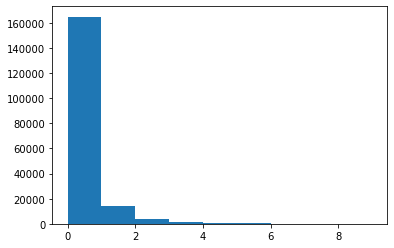

In [9]:
plt.hist(np.abs(stats.zscore(gdf.seconds)), bins=np.arange(0,10))

## Spatial stats

In [24]:
wq = ps.lib.weights.contiguity.Queen.from_dataframe(mtl_dissem)

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/lib/weights/weights.py:168: UserWarning: There are 4 disconnected observations 
  Island ids: 3641, 4879, 6388, 6599
  " Island ids: %s" % ', '.join(str(island) for island in self.islands))


In [32]:
y = mtl_dissem.reset_index().merge(gdf_per_dissem.groupby(['index_left'])\
                                   .agg({"id_trip":"count"}).reset_index(),\
                                   left_on='index',right_on='index_left', how='left')['id_trip'].fillna(0).values


In [34]:
moran_global = ps.explore.esda.Moran(y, wq)

In [37]:
moran_global.I, moran_global.p_norm

(0.5912638591682543, 0.0)

In [53]:
mtl_dissem.reset_index().merge(gdf_per_dissem.loc[gdf_per_dissem.purpose == pur].groupby(['index_left'])\
                                   .agg({"id_trip":"count", "temperatur":"mean"}).reset_index(),\
                               left_on='index',right_on='index_left', how='left')

,index,DAUID,CDUID,CDNAME,CDTYPE,CSDUID,CSDNAME,CSDTYPE,CCSUID,CCSNAME,...,SACCODE,SACTYPE,CTUID,CTNAME,PRUID,PRNAME,geometry,index_left,id_trip,temperatur
0,0,24700071,2470,Beauharnois-Salaberry,MRC,2470022,Beauharnois,V,2470022,Beauharnois,...,462,1,4620777.02,0777.02,24,Quebec / Qubec,(POLYGON ((7614920.211429008 1216981.757154953...,NaN,NaN,NaN
1,1,24650694,2465,Laval,T,2465005,Laval,V,2465005,Laval,...,462,1,4620659.10,0659.10,24,Quebec / Qubec,(POLYGON ((7612254.411394808 1252883.785716854...,NaN,NaN,NaN
2,2,24662467,2466,Montral,T,2466023,Montral,V,2466023,Montral,...,462,1,4620416.01,0416.01,24,Quebec / Qubec,(POLYGON ((7618928.159977993 1242899.359981268...,NaN,NaN,NaN
3,3,24662706,2466,Montral,T,2466023,Montral,V,2466023,Montral,...,462,1,4620619.00,0619.00,24,Quebec / Qubec,"(POLYGON ((7622684.02860707 1251714.83427309, ...",3.0,4.0,12.486182
4,4,24580036,2458,Longueuil,T,2458227,Longueuil,V,2458227,Longueuil,...,462,1,4620880.00,0880.00,24,Quebec / Qubec,(POLYGON ((7635632.045734551 1249192.339954694...,4.0,1.0,14.484780
5,5,24650689,2465,Laval,T,2465005,Laval,V,2465005,Laval,...,462,1,4620659.04,0659.04,24,Quebec / Qubec,(POLYGON ((7613715.645670315 1250303.385727328...,NaN,NaN,NaN
6,6,24663205,2466,Montral,T,2466023,Montral,V,2466023,Montral,...,462,1,4620110.00,0110.00,24,Quebec / Qubec,(POLYGON ((7627742.917125324 1240895.194303191...,6.0,6.0,18.109025
7,7,24650386,2465,Laval,T,2465005,Laval,V,2465005,Laval,...,462,1,4620652.08,0652.08,24,Quebec / Qubec,"(POLYGON ((7613434.29716932 1241990.831383836,...",NaN,NaN,NaN
8,8,24662272,2466,Montral,T,2466097,Pointe-Claire,V,2466023,Montral,...,462,1,4620453.01,0453.01,24,Quebec / Qubec,(POLYGON ((7614910.188579189 1235567.645672865...,NaN,NaN,NaN
9,9,24540193,2454,Les Maskoutains,MRC,2454048,Saint-Hyacinthe,V,2454048,Saint-Hyacinthe,...,452,3,None,None,24,Quebec / Qubec,(POLYGON ((7675353.971473472 1272150.774250535...,NaN,NaN,NaN


In [49]:
for pur in gdf['purpose'].unique():
# pur = 'cafe'
    y = mtl_dissem.reset_index().merge(gdf_per_dissem.loc[gdf_per_dissem.purpose == pur].groupby(['index_left'])\
                                   .agg({"id_trip":"count"}).reset_index(),\
                                   left_on='index',right_on='index_left', how='left')['id_trip'].fillna(0).values
    moran_global = ps.explore.esda.Moran(y, wq)
    print(pur, moran_global.I, moran_global.p_norm, moran_global.p_sim)

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/explore/esda/moran.py:206: RuntimeWarning: invalid value encountered in double_scalars
  k = k_num / k_den
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/explore/esda/moran.py:217: RuntimeWarning: invalid value encountered in double_scalars
  return self.n / self.w.s0 * inum / self.z2ss
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/explore/esda/moran.py:165: RuntimeWarning: invalid value encountered in greater_equal
  above = sim >= self.I
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/explore/esda/moran.py:181: RuntimeWarning: invalid value encountered in true_divide
  self.z /= sy


None nan nan 0.001
pick_up_a_person 0.5629000152701666 0.0 0.001
work 0.5921787733479512 0.0 0.001
shops 0.5921624780237638 0.0 0.001
returning_home 0.6169009566510006 0.0 0.001
health 0.547517193189426 0.0 0.001
leisure 0.5448749744913084 0.0 0.001
education 0.5872240653154563 0.0 0.001
other 0.5518371624439252 0.0 0.001
cafe 0.5733876521027782 0.0 0.001
not_available 0.4356105321751141 0.0 0.001


In [44]:
moran_global = ps.explore.esda.Moran(y, wq)
moran_global.I, moran_global.p_sim

(0.4356105321751141, 0.001)

In [61]:
pur_mtl_dissem['id_trip'].values

array([0., 0., 0., ..., 0., 0., 0.])

In [72]:
pur_mtl_dissem['id_trip'].values.reshape(-1,1)

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [5.]])

In [76]:
wq = ps.lib.weights.contiguity.Queen.from_dataframe(pur_mtl_dissem)

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/lib/weights/weights.py:168: UserWarning: There are 4 disconnected observations 
  Island ids: 3641, 4879, 6388, 6599
  " Island ids: %s" % ', '.join(str(island) for island in self.islands))


In [197]:
pur = 'cafe'
pur_mtl_dissem = mtl_dissem.reset_index().merge(gdf_per_dissem.loc[gdf_per_dissem.purpose == pur].groupby(['index_left'])\
                                   .agg({"id_trip":"count", "temperatur":"mean"}).reset_index(),\
                               left_on='index',right_on='index_left', how='left')

x = pur_mtl_dissem[['id_trip']].fillna(0.0).values
y = pur_mtl_dissem[['temperatur']].fillna(0.0).values
x.shape = (len(x),1)
y.shape = (len(y),1)
ml_reg = ps.model.spreg.ML_Lag(x=x, y=y, w=wq, method = "ORD")


/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/model/spreg/w_utils.py:23: RuntimeWarning: divide by zero encountered in true_divide
  Di12 = SPARSE.spdiags(1. / d, [0], w.n, w.n)
/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/scipy/optimize/_minimize.py:760: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  "defaulting to absolute tolerance.", RuntimeWarning)


TypeError: No loop matching the specified signature and casting was found for ufunc add

In [ ]:
# print(ml_reg.summary)

## Point Pattern analysis

In [53]:
from pysal.explore.pointpats import PointPattern, PoissonPointProcess, as_window, G, F, J, K, L, Genv, Fenv, Jenv, Kenv, Lenv

In [139]:
points = non_city.start_can.apply(lambda row: [row.x, row.y]).values.tolist()
pp = PointPattern(points)

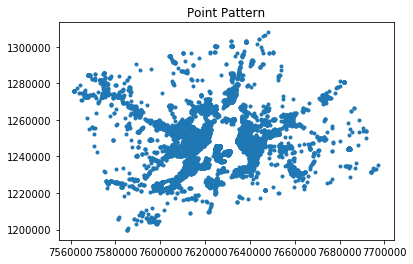

In [140]:
pp.plot()

In [48]:
pp.summary()

Point Pattern
16302 points
Bounding rectangle [(7561551.690888111,1199793.416920047), (7697289.0554951,1307890.115485875)]
Area of window: 14672760986.041626
Intensity estimate for window: 1.111038339376501e-06
              x             y
0  7.616417e+06  1.246781e+06
1  7.632651e+06  1.273798e+06
2  7.632924e+06  1.274447e+06
3  7.608402e+06  1.254569e+06
4  7.619882e+06  1.261650e+06


CPU times: user 5.86 s, sys: 90.5 ms, total: 5.95 s
Wall time: 6.04 s


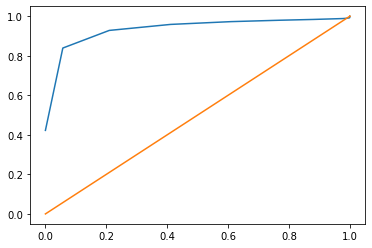

In [49]:
%%time
gp1 = G(pp, intervals=50)
gp1.plot(qq=True) # q-q

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/pysal/explore/pointpats/distance_statistics.py:217: RuntimeWarning: invalid value encountered in true_divide
  self.ev = self.j / self.j


CPU times: user 905 ms, sys: 18.6 ms, total: 924 ms
Wall time: 938 ms


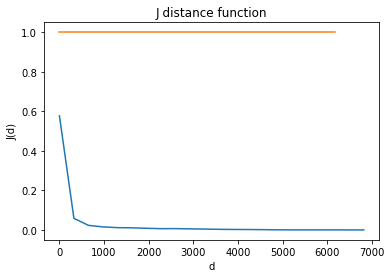

In [50]:
%%time
jp1 = J(pp, intervals=20)
jp1.plot()

In [51]:
from pysal.explore.pointpats.centrography import hull, mbr, mean_center, weighted_mean_center, manhattan_median, std_distance,euclidean_median,ellipse

In [51]:
stdd = std_distance(pp.points)
stdd


22490.505281960443

In [54]:
for df, df_name in zip([gdf, non_city, city, start_city,start_non_city, end_city, end_non_city], ["gdf", "non_city", "city", "start_city","start_non_city", "end_city", "end_non_city"]):
    points = df.start_can.apply(lambda row: [row.x, row.y]).values.tolist()
    pp = PointPattern(points)
    stdd = std_distance(pp.points)
    print("start", stdd, df_name)
    points = df.end_can.apply(lambda row: [row.x, row.y]).values.tolist()
    pp = PointPattern(points)
    stdd = std_distance(pp.points)
    print("end", stdd, df_name)

start 9713.826359535818 gdf
end 10325.311816545141 gdf
start 22490.505281960443 non_city
end 23222.92956713635 non_city
start 7195.074774048591 city
end 7868.470941735599 city
start 5724.2563911346 start_city
end 7889.721718425147 start_city
start 21448.36851129677 start_non_city
end 19278.193419199233 start_non_city
start 7202.187653236456 end_city
end 5806.3170095870855 end_city
start 18340.492231186887 end_non_city
end 22810.647505557634 end_non_city


In [55]:
start_end = {}
for df, df_name in zip([gdf, non_city, city, start_city,start_non_city, end_city, end_non_city], ["gdf", "non_city", "city", "start_city","start_non_city", "end_city", "end_non_city"]):
    start_ls = []
    end_ls = []
    for pur in gdf.purpose.unique()[1:]:
        points = df.loc[df.purpose == pur].start_can.apply(lambda row: [row.x, row.y]).values.tolist()
        pp = PointPattern(points)
        stdd = std_distance(pp.points)
        start_ls.append(stdd)
        print("start", stdd, pur, df_name)

        points = df.loc[df.purpose == pur].end_can.apply(lambda row: [row.x, row.y]).values.tolist()
        pp = PointPattern(points)
        stdd = std_distance(pp.points)
        end_ls.append(stdd)
        print("end", stdd, pur, df_name)
    start_end[df_name] = [start_ls, end_ls]

start 10748.093613291074 pick_up_a_person gdf
end 10531.946790549913 pick_up_a_person gdf
start 8142.291029794205 work gdf
end 7322.546228735784 work gdf
start 9128.590215004537 shops gdf
end 9251.171032214525 shops gdf
start 9212.641481963537 returning_home gdf
end 8347.64746971052 returning_home gdf
start 8450.766338880485 health gdf
end 8905.186668390335 health gdf
start 9962.322518746785 leisure gdf
end 10457.084534686337 leisure gdf
start 7690.592232524286 education gdf
end 6375.67283047521 education gdf
start 10844.007389112521 other gdf
end 11264.075233262414 other gdf
start 8788.093895029873 cafe gdf
end 8475.46028893859 cafe gdf
start 11155.04903451358 not_available gdf
end 11934.833371090823 not_available gdf
start 22327.2548705925 pick_up_a_person non_city
end 21273.71534531535 pick_up_a_person non_city
start 19101.777070484524 work non_city
end 18119.148828876012 work non_city
start 20418.900512656208 shops non_city
end 19992.155636704043 shops non_city
start 18982.28536203

In [56]:
a = np.array(start_end['gdf'][0]).reshape(-1,1)

In [57]:
data_names = ["Overall", "Outside City", "Within City", "Start in City","Start Outside City", "End in City", "End Outside City"]

Start points


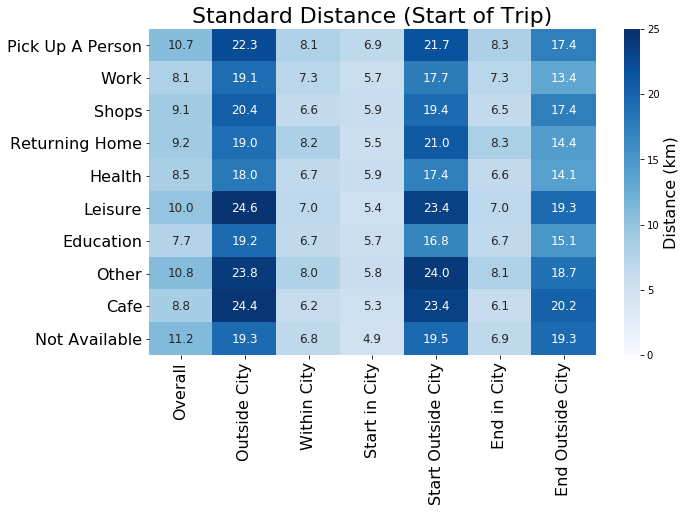

In [60]:
print("Start points")
fig, ax = plt.subplots(1, figsize=(10,6))
sns.heatmap(np.concatenate(([np.array(start_end[a][0]).reshape(-1,1) for a in start_end.keys()]), axis=1)/1000, cmap='Blues', annot=True, ax=ax, annot_kws={'fontsize':12},fmt='.1f', vmin=0, vmax=25, cbar_kws={'label': 'Distance (km)', "orientation": "vertical"})
ax.set_yticklabels([pur.replace("_"," ").title() for pur in gdf.purpose.unique()[1:]], size=16, rotation=0);
ax.figure.axes[-1].yaxis.label.set_size(16)
ax.set_xticklabels(data_names, size=16, rotation=90);
ax.set_title("Standard Distance (Start of Trip)", size=22)
# plt.savefig("figures/standard_dist_start.png", bbox_inches='tight')

End points


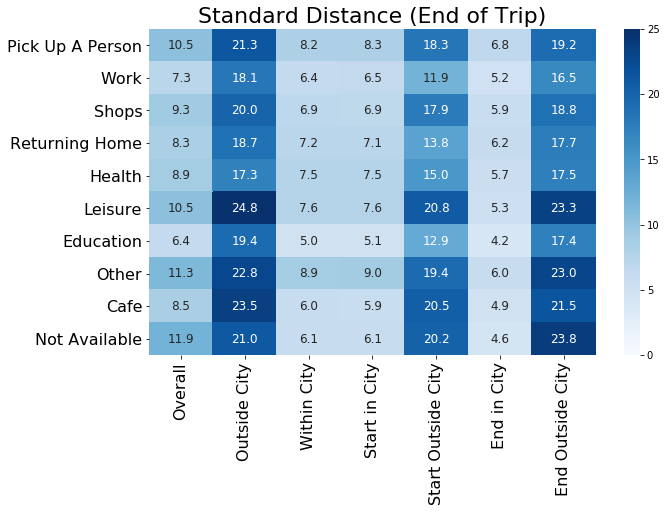

In [61]:
print("End points")
fig, ax = plt.subplots(1, figsize=(10,6))
sns.heatmap(np.concatenate(([np.array(start_end[a][1]).reshape(-1,1) for a in start_end.keys()]), axis=1)/1000, cmap='Blues', annot=True, ax=ax, annot_kws={'fontsize':12}, fmt='.1f', vmin=0, vmax=25)
ax.set_yticklabels([pur.replace("_"," ").title() for pur in gdf.purpose.unique()[1:]], size=16, rotation=0);
ax.set_xticklabels(data_names, size=16, rotation=90)
ax.figure.axes[-1].yaxis.label.set_size(16)
ax.set_title("Standard Distance (End of Trip)", size=22)
# plt.savefig("figures/standard_dist_end.png", bbox_inches='tight')

In [129]:
from pysal.explore.pointpats import quadrat_statistics as qs

In [148]:
q_r = qs.QStatistic(pp,shape= "rectangle",nx = 10, ny = 10)

In [156]:
pp.window

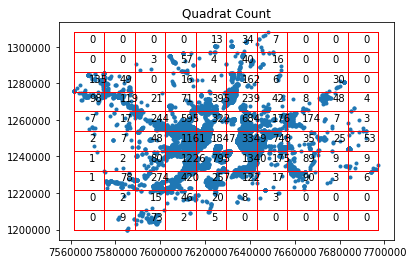

In [149]:
q_r.plot()

In [40]:
# %%time
# kp1 = K(pp)
# kp1.plot()

In [29]:
## Takes too long
# %%time
# realizations = PoissonPointProcess(pp.window, pp.n, 100, asPP=True) # simulate CSR 100 times
# kenv = Kenv(pp, intervals=20, realizations=realizations)
# kenv.plot()

## join data by dissem and purpose for bivariate correlation in GeoDA

### time correlation

In [69]:
corr_matrix_time = gdf.set_index('starttime').groupby([pd.Grouper(freq='1h'), "purpose"]).agg({"id_trip":"count"}).unstack().fillna(0)['id_trip'].corr()

In [93]:
[print(col, stats.kstest(hour_purpose_grouped[col].fillna(0), 'norm')) for col in hour_purpose_grouped.columns]

cafe KstestResult(statistic=0.5551535507713675, pvalue=3.287213099129875e-205)
education KstestResult(statistic=0.5, pvalue=9.82488208886262e-164)
health KstestResult(statistic=0.5, pvalue=9.82488208886262e-164)
leisure KstestResult(statistic=0.7251252221594695, pvalue=0.0)
not_available KstestResult(statistic=0.5, pvalue=9.82488208886262e-164)
other KstestResult(statistic=0.5, pvalue=9.82488208886262e-164)
pick_up_a_person KstestResult(statistic=0.5, pvalue=9.82488208886262e-164)
returning_home KstestResult(statistic=0.8370232391566367, pvalue=0.0)
shops KstestResult(statistic=0.6061450521877981, pvalue=3.586226223248267e-249)
work KstestResult(statistic=0.749204542272784, pvalue=0.0)


[None, None, None, None, None, None, None, None, None, None]

In [87]:
hour_purpose_grouped = gdf.set_index('starttime').groupby([pd.Grouper(freq='1h'), "purpose"]).agg({"id_trip":"count"}).unstack()['id_trip']

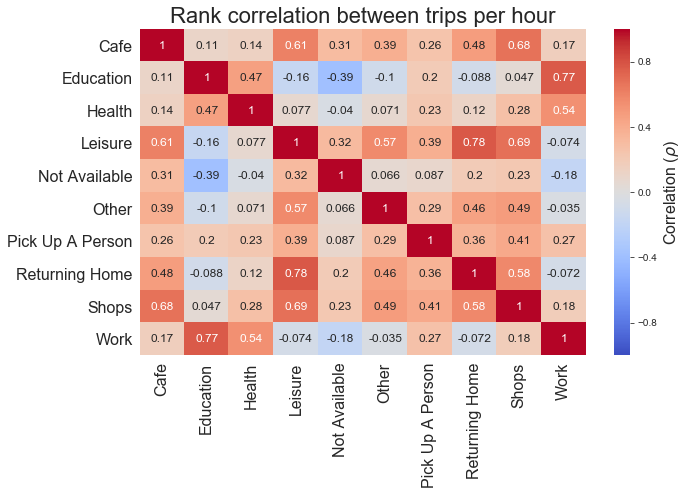

In [113]:
purposes = ["cafe","education","health","leisure","not_available","other","pick_up_a_person","returning_home","shops","work"]
fig, ax = plt.subplots(1, figsize=(10,6))
sns.heatmap(hour_purpose_grouped[purposes].corr('spearman'),\
           vmin=-1, vmax=1, annot=True, cmap="coolwarm", ax=ax, annot_kws={'fontsize':12}, cbar_kws={'label': 'Correlation ($\u03C1$)', "orientation": "vertical"})
ax.figure.axes[-1].yaxis.label.set_size(16)
ax.set_xticklabels([str(i).replace("_"," ").title() for i in purposes], size=16);
ax.set_yticklabels([str(i).replace("_"," ").title() for i in purposes], size=16);
plt.title("Rank correlation between trips per hour", size=22)
plt.xlabel("")
plt.ylabel("")
# plt.savefig("figures/spearman_corr_temp_pur.png", bbox_inches='tight')

### space correlation

In [94]:
start_can_gdf = gdf[["start_can","purpose"]]
start_can_gdf.columns = ["geometry","purpose"]
start_can_gdf = gpd.GeoDataFrame(start_can_gdf)
start_dissem_joined = gpd.sjoin(start_can_gdf, mtl_dissem, how='right')
by_purpose_dissem = start_dissem_joined.groupby([start_dissem_joined.index,start_dissem_joined.purpose]).agg({'index_left':'count', 'geometry':'first'})
by_purpose_dissem = by_purpose_dissem.unstack()['index_left'].fillna(0)
mtl_dissem_counts_dissem = mtl_dissem.merge(by_purpose_dissem, left_on=mtl_dissem.index, right_on='index_right')

/Applications/anaconda/envs/st-ds/lib/python3.7/site-packages/geopandas/tools/sjoin.py:56: UserWarning: CRS of frames being joined does not match!(None != {'init': 'epsg:3347'})
  '(%s != %s)' % (left_df.crs, right_df.crs))


In [98]:
purposes = ["cafe","education","health","leisure","not_available","other","pick_up_a_person","returning_home","shops","work"]
mtl_dissem_counts_dissem_purp = mtl_dissem_counts_dissem[purposes]

In [ ]:
# mtl_dissem_counts_dissem.to_file("../shapes/mtl_dissem_counts_purpose.shp")

In [99]:
[print(col, stats.kstest(mtl_dissem_counts_dissem_purp[col].fillna(0), 'norm')) for col in mtl_dissem_counts_dissem_purp.columns]

cafe KstestResult(statistic=0.5, pvalue=0.0)
education KstestResult(statistic=0.5, pvalue=0.0)
health KstestResult(statistic=0.5, pvalue=0.0)
leisure KstestResult(statistic=0.5, pvalue=0.0)
not_available KstestResult(statistic=0.5, pvalue=0.0)
other KstestResult(statistic=0.5, pvalue=0.0)
pick_up_a_person KstestResult(statistic=0.5, pvalue=0.0)
returning_home KstestResult(statistic=0.5567048189947053, pvalue=0.0)
shops KstestResult(statistic=0.5, pvalue=0.0)
work KstestResult(statistic=0.5, pvalue=0.0)


[None, None, None, None, None, None, None, None, None, None]

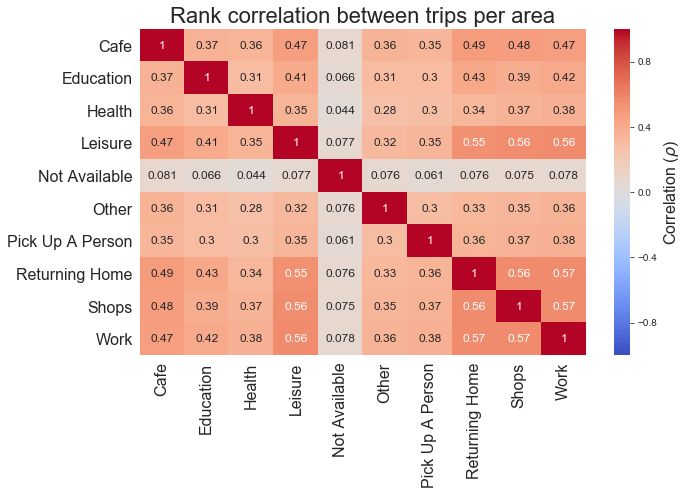

In [115]:
purposes = ["cafe","education","health","leisure","not_available","other","pick_up_a_person","returning_home","shops","work"]
fig, ax = plt.subplots(1, figsize=(10,6))
sns.heatmap(mtl_dissem_counts_dissem[purposes].corr('spearman'),\
           vmin=-1, vmax=1, annot=True, cmap="coolwarm", ax=ax, annot_kws={'fontsize':12}, cbar_kws={'label': 'Correlation ($\u03C1$)', "orientation": "vertical"})
ax.figure.axes[-1].yaxis.label.set_size(16)
ax.set_xticklabels([str(i).replace("_"," ").title() for i in purposes], size=16);
ax.set_yticklabels([str(i).replace("_"," ").title() for i in purposes], size=16);
plt.title("Rank correlation between trips per area", size=22)

# plt.savefig("figures/spearman_corr_space_pur.png", bbox_inches='tight')